In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

In [3]:
# Loading the data 
df = pd.read_csv("AirQualityUCI.csv",parse_dates={'datetime': ['Date', 'Time']})

In [4]:
df.shape

(9471, 16)

In [5]:
df.columns

Index(['datetime', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH', 'Unnamed: 15', 'Unnamed: 16'],
      dtype='object')

In [6]:
# Dropping last 2 empty columns
df = df.drop(columns=['Unnamed: 15', 'Unnamed: 16'])

In [7]:
# Checking for NA values
df.isna().sum()

datetime           0
CO(GT)           114
PT08.S1(CO)      114
NMHC(GT)         114
C6H6(GT)         114
PT08.S2(NMHC)    114
NOx(GT)          114
PT08.S3(NOx)     114
NO2(GT)          114
PT08.S4(NO2)     114
PT08.S5(O3)      114
T                114
RH               114
AH               114
dtype: int64

In [8]:
# Removing NA values
df.dropna(inplace=True)

In [9]:
df.shape

(9357, 14)

In [10]:
df['datetime'] = pd.to_datetime(df['datetime'], format='%d/%m/%Y %H:%M:%S')

In [11]:
df.dtypes

datetime         datetime64[ns]
CO(GT)                  float64
PT08.S1(CO)             float64
NMHC(GT)                float64
C6H6(GT)                float64
PT08.S2(NMHC)           float64
NOx(GT)                 float64
PT08.S3(NOx)            float64
NO2(GT)                 float64
PT08.S4(NO2)            float64
PT08.S5(O3)             float64
T                       float64
RH                      float64
AH                      float64
dtype: object

In [12]:
# Replacing -200 values with NA
df.replace(to_replace= -200, value= np.NaN, inplace= True)

In [13]:
df.isna().sum()

datetime            0
CO(GT)           1683
PT08.S1(CO)       366
NMHC(GT)         8443
C6H6(GT)          366
PT08.S2(NMHC)     366
NOx(GT)          1639
PT08.S3(NOx)      366
NO2(GT)          1642
PT08.S4(NO2)      366
PT08.S5(O3)       366
T                 366
RH                366
AH                366
dtype: int64

In [14]:
# Column NMHC(GT) has 8443 NA values out of 9357 so removing that column.
df.drop('NMHC(GT)', axis=1, inplace=True)

In [15]:
# Imputing the NA values with the mean of the respective column.
cols = df.columns[1:13]
for i in cols:
    df[i] = df[i].fillna(df[i].mean())

In [16]:
df.isna().sum()

datetime         0
CO(GT)           0
PT08.S1(CO)      0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64

In [17]:
df.columns

In [18]:
#EDA
# Indexing the data
df_ni = df.copy()
df = df.set_index('datetime')

In [132]:
df_ni.to_csv('clean.csv', encoding='utf-8')


In [19]:
df_ni.head()

,datetime,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10 18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10 19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10 20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10 21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10 22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [20]:
df_ni['Day_of_Week'] = df_ni['datetime'].dt.day_name()
df1 = df[['PT08.S1(CO)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S4(NO2)','PT08.S5(O3)','T']]
df2 = df[['CO(GT)','C6H6(GT)','NOx(GT)','NO2(GT)']]
df_ni.head(10)

,datetime,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Day_of_Week
0,2004-03-10 18:00:00,2.6,1360.0,11.9,1046.0,166.000000,1056.0,113.000000,1692.0,1268.0,13.6,48.9,0.7578,Wednesday
1,2004-03-10 19:00:00,2.0,1292.0,9.4,955.0,103.000000,1174.0,92.000000,1559.0,972.0,13.3,47.7,0.7255,Wednesday
2,2004-03-10 20:00:00,2.2,1402.0,9.0,939.0,131.000000,1140.0,114.000000,1555.0,1074.0,11.9,54.0,0.7502,Wednesday
3,2004-03-10 21:00:00,2.2,1376.0,9.2,948.0,172.000000,1092.0,122.000000,1584.0,1203.0,11.0,60.0,0.7867,Wednesday
4,2004-03-10 22:00:00,1.6,1272.0,6.5,836.0,131.000000,1205.0,116.000000,1490.0,1110.0,11.2,59.6,0.7888,Wednesday
5,2004-03-10 23:00:00,1.2,1197.0,4.7,750.0,89.000000,1337.0,96.000000,1393.0,949.0,11.2,59.2,0.7848,Wednesday
6,2004-03-11 00:00:00,1.2,1185.0,3.6,690.0,62.000000,1462.0,77.000000,1333.0,733.0,11.3,56.8,0.7603,Thursday
7,2004-03-11 01:00:00,1.0,1136.0,3.3,672.0,62.000000,1453.0,76.000000,1333.0,730.0,10.7,60.0,0.7702,Thursday
8,2004-03-11 02:00:00,0.9,1094.0,2.3,609.0,45.000000,1579.0,60.000000,1276.0,620.0,10.7,59.7,0.7648,Thursday
9,2004-03-11 03:00:00,0.6,1010.0,1.7,561.0,246.896735,1705.0,113.091251,1235.0,501.0,10.3,60.2,0.7517,Thursday


In [23]:
dfx = df_ni.drop(columns =['datetime']).groupby('Day_of_Week').mean().sort_values('Day_of_Week')
dfx.head(10)

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
Day_of_Week,,,,,,,,,,,,
Friday,2.490770,1140.628708,11.604819,996.643337,279.021399,790.123027,121.925646,1522.084813,1101.520406,18.747186,50.074619,1.061927
Monday,2.038339,1070.436450,9.958696,927.569969,236.828545,859.425315,110.743398,1433.670013,978.114604,18.024547,47.605239,0.984545
Saturday,1.902962,1090.079115,8.525915,898.126826,228.392735,836.748436,108.529280,1398.105084,982.824775,18.202296,48.954871,1.011848
Sunday,1.568881,1018.579982,6.131878,794.776147,178.364029,937.607386,95.786186,1316.099810,820.157340,17.812486,49.275761,1.002158
Thursday,2.398287,1138.175091,11.451501,988.481947,276.680039,800.706512,119.557551,1515.561400,1104.519664,18.595423,50.066290,1.055586
Tuesday,2.332191,1116.089893,11.626785,986.469506,263.623834,812.717211,116.555645,1503.123971,1078.727932,18.319306,48.622276,1.014445
Wednesday,2.342800,1125.277140,11.325515,983.365387,265.851703,810.546773,118.661797,1506.566248,1096.156078,18.524387,50.029159,1.048031


# On adding the day of the week column to the dataset and groupying by the same to get an idea if the value of day has any significant affect on the concentration of the pollutants. We do observe some pattern in the values i.e. low on the weekends and then increasing till friday and thensettling again.

In [27]:
df.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,2.152750,1099.833166,10.083105,939.153376,246.896735,835.493605,113.091251,1456.264598,1022.906128,18.317829,49.234201,1.025530
std,1.316068,212.791672,7.302650,261.560236,193.426632,251.743954,43.920954,339.367559,390.612324,8.657639,16.974801,0.395835
min,0.100000,647.000000,0.100000,383.000000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.200000,0.184700
25%,1.200000,941.000000,4.600000,743.000000,112.000000,666.000000,86.000000,1242.000000,742.000000,12.000000,36.600000,0.746100
50%,2.152750,1075.000000,8.600000,923.000000,229.000000,818.000000,113.091251,1456.264598,983.000000,18.300000,49.234201,1.015400
75%,2.600000,1221.000000,13.600000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,24.100000,61.900000,1.296200
max,11.900000,2040.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000


C:\ProgramData\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



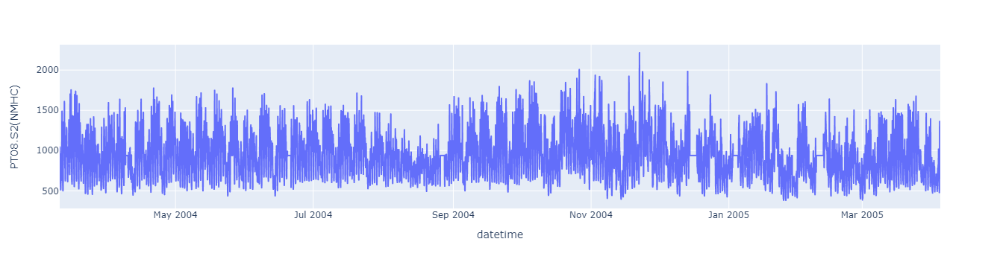

C:\ProgramData\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



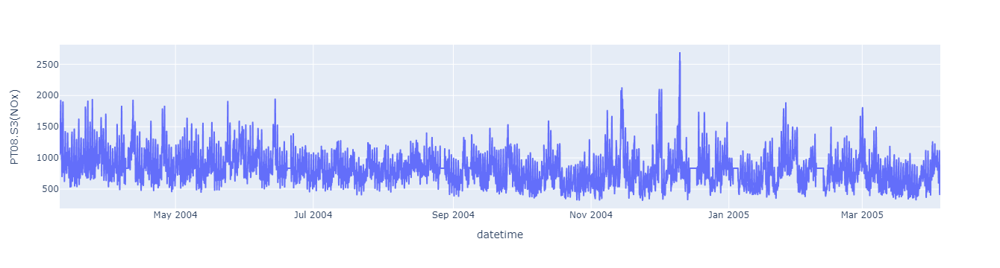

C:\ProgramData\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



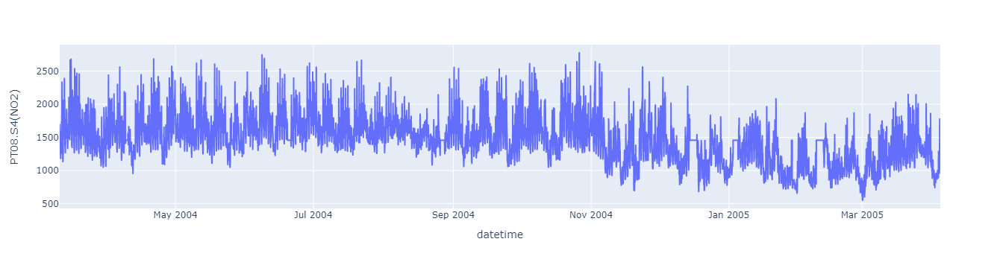

C:\ProgramData\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



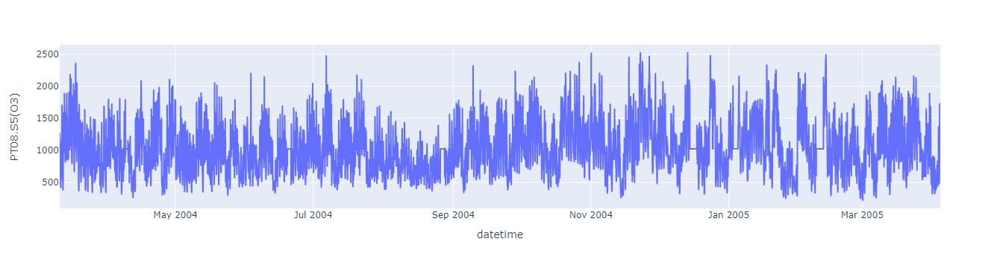

C:\ProgramData\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



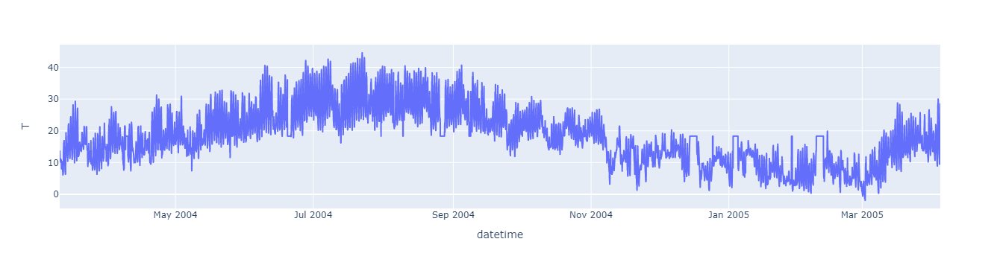

In [27]:
#Concentration of air pollutants
for i in df1.columns[1:7]:
  fig =px.line(df[:], y=i)
  fig.show()

- Temperature follows a seasonal pattern (High during summers and low during winters)
- No observable pattern when viewing the whole time series at once. When the window is reduced, some daily seasonality can be observed.


In [35]:
df3 = df_ni[['datetime','PT08.S1(CO)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S4(NO2)','PT08.S5(O3)','T']]
df3.head()

,datetime,PT08.S1(CO),PT08.S2(NMHC),PT08.S3(NOx),PT08.S4(NO2),PT08.S5(O3),T
0,2004-03-10 18:00:00,1360.0,1046.0,1056.0,1692.0,1268.0,13.6
1,2004-03-10 19:00:00,1292.0,955.0,1174.0,1559.0,972.0,13.3
2,2004-03-10 20:00:00,1402.0,939.0,1140.0,1555.0,1074.0,11.9
3,2004-03-10 21:00:00,1376.0,948.0,1092.0,1584.0,1203.0,11.0
4,2004-03-10 22:00:00,1272.0,836.0,1205.0,1490.0,1110.0,11.2


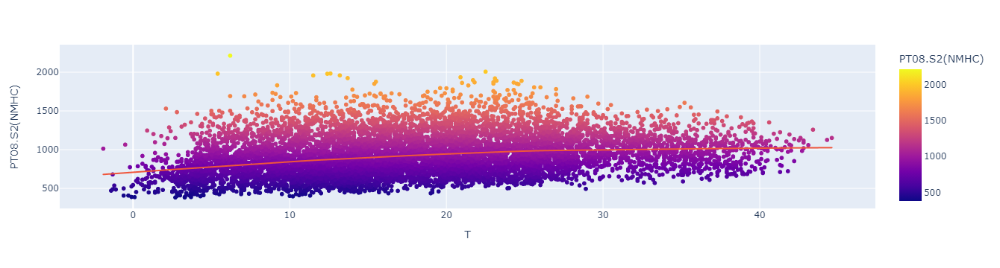

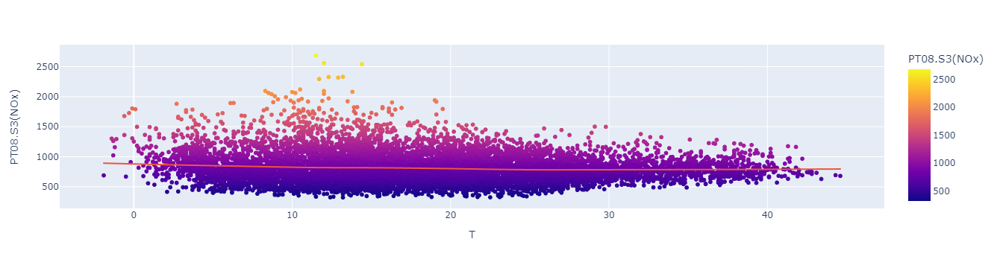

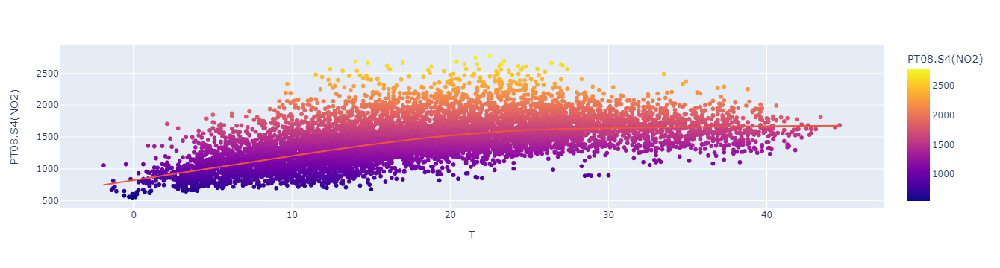

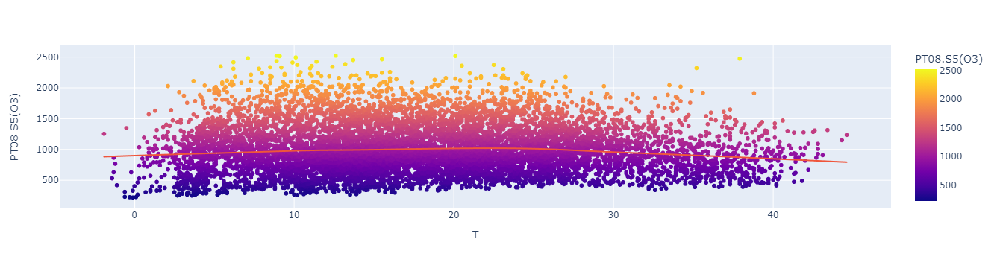

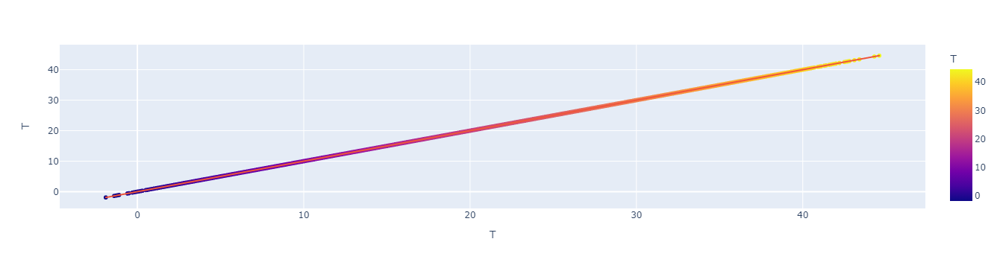

In [25]:
# Affect of temperature on the sensor values

for i in df1.columns[1:7]:
  fig =px.scatter(df, x='T', y=i, color =i , trendline='lowess')
  fig.show()



- CO shows almost no linear change with temperature
- NMHC shows slightly positive linear trend
- NOx shows negative linear trend
- NO2 shows strongly positive linear trend
- O3 shows very slight negative 


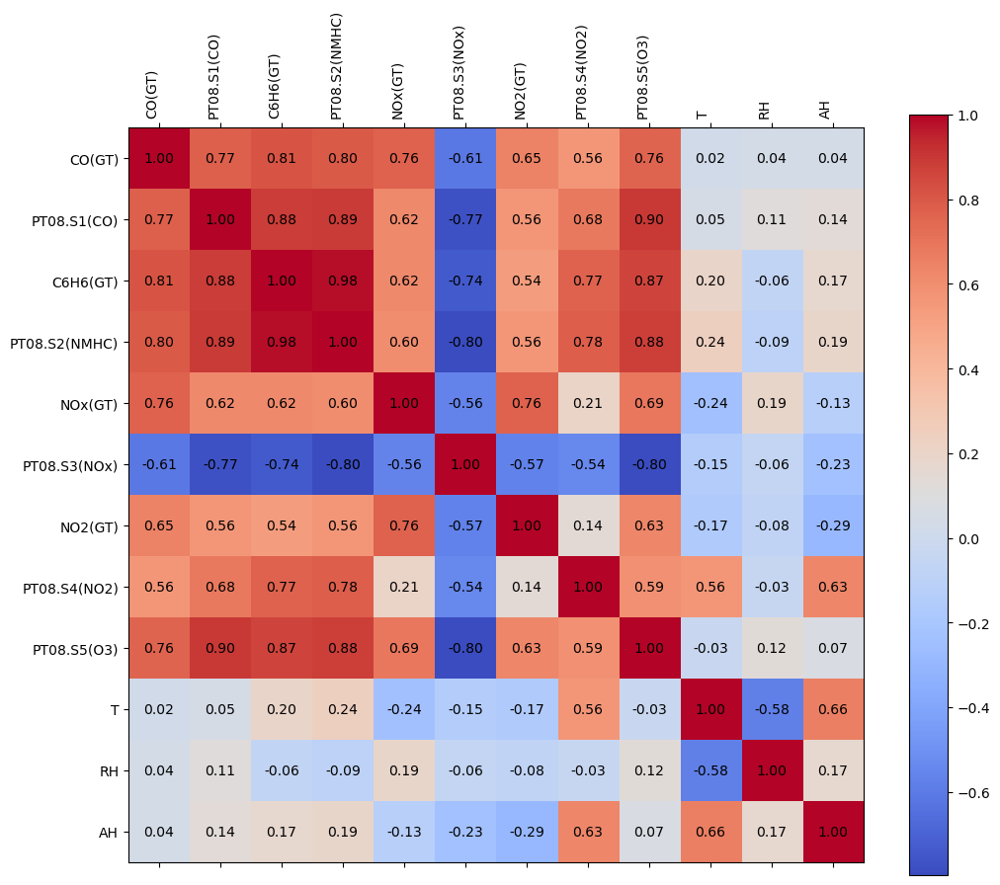

In [70]:
df4 = df_ni.drop(columns=['datetime','Day_of_Week'])
correlation = df4.corr()

fig_corr = plt.figure(figsize=(12, 10))  
ax = fig_corr.add_subplot(111)  

cax = ax.matshow(correlation, cmap='coolwarm')
fig_corr.colorbar(cax)  
for (i, j), val in np.ndenumerate(correlation):
    ax.text(j, i, f'{val:.2f}', ha='center', va='center', fontsize=10, color='black')

# Set x and y axis labels
ax.set_xticks(np.arange(len(correlation.columns)))
ax.set_yticks(np.arange(len(correlation.index)))
ax.set_xticklabels(correlation.columns, rotation=90, ha='right')
ax.set_yticklabels(correlation.index)

plt.show()

# From the above plot we can see that:       
- Temperature is only correlated with S4.(NO2),Relative and Absolute humidity.
- Every sensor value except PT08.S3(NOx) has high to moderate correlation with each other.
- PT08.S3(NOx) has high negative correlation with every other sensor variable.

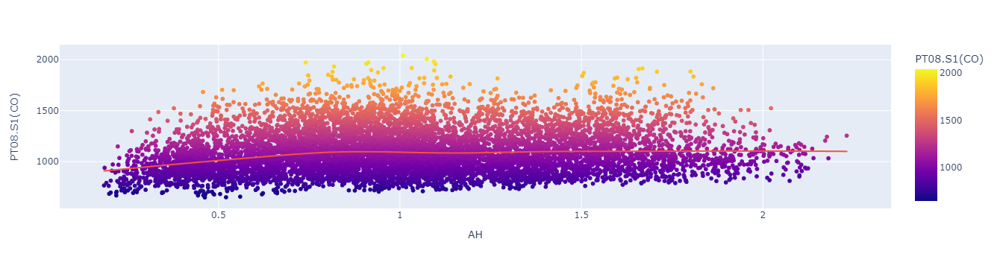

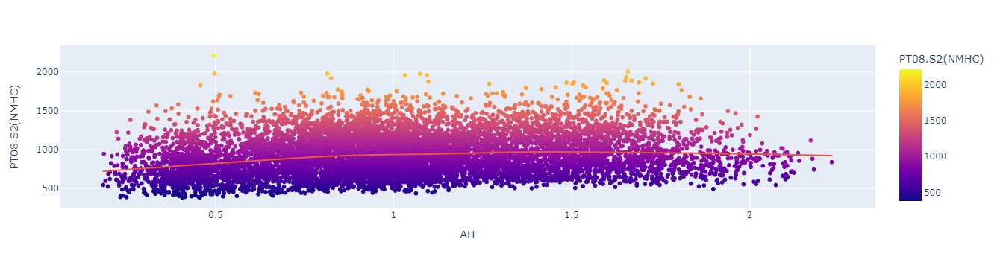

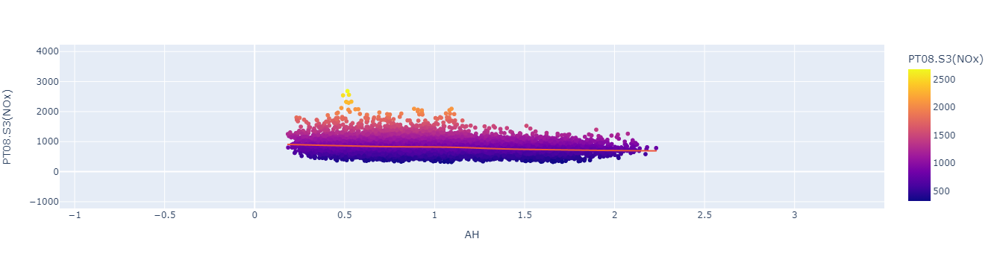

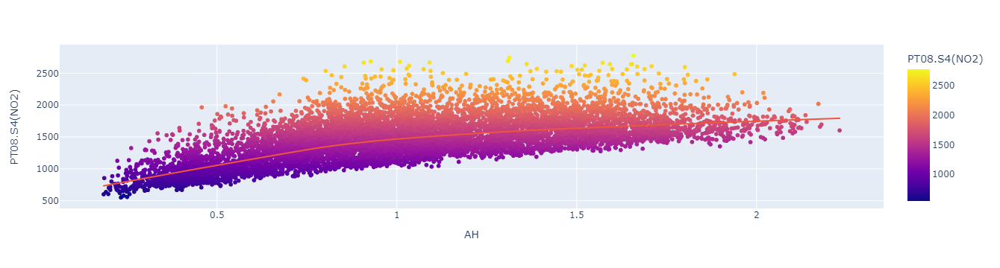

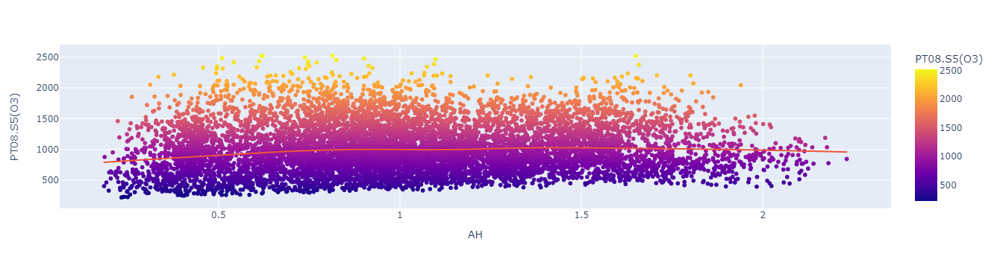

In [79]:
# Affect of humidity on the sensor values

df1 = df_ni[['datetime','PT08.S1(CO)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S4(NO2)','PT08.S5(O3)','T','AH']]

for i in df1.columns[1:6]:
  fig =px.scatter(df1, x='AH', y=i, color =i , trendline='lowess')
  fig.show()


- CO shows almost Positive linear change with Abs. Humidity
- NMHC shows slightly positive linear trend
- NOx shows negative linear trend
- NO2 shows strongly positive linear trend
- O3 shows slight positive linear trend 


In [84]:
df1 = df_ni[['datetime','PT08.S1(CO)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S4(NO2)','PT08.S5(O3)','T','AH']]

In [93]:
df_ni.columns

Index(['datetime', 'CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)',
       'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
       'T', 'RH', 'AH'],
      dtype='object')

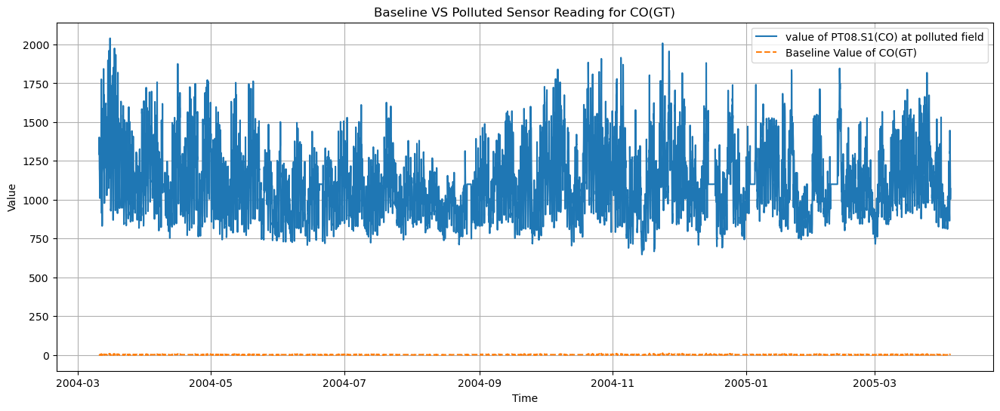

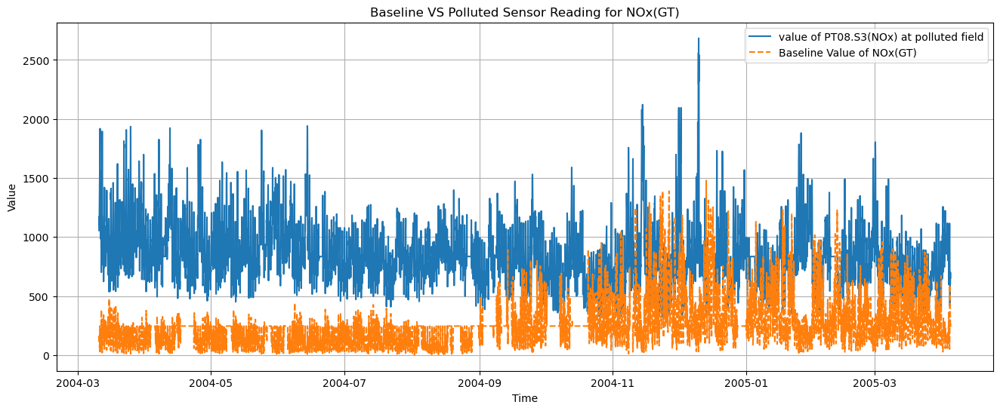

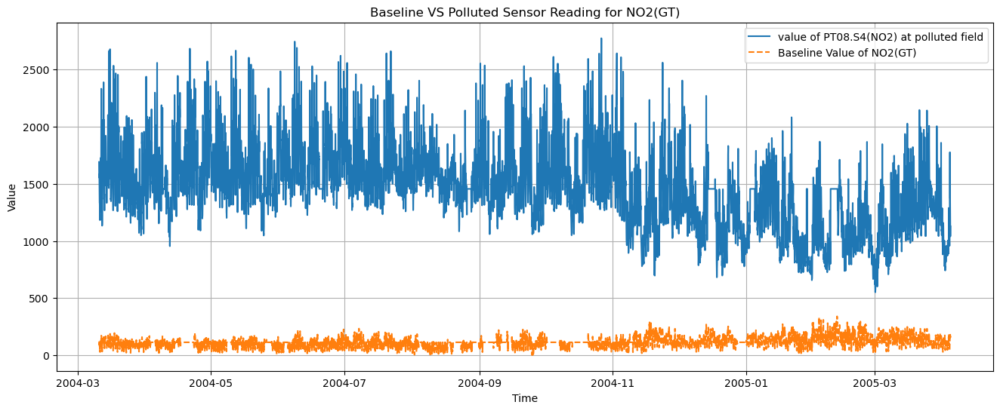

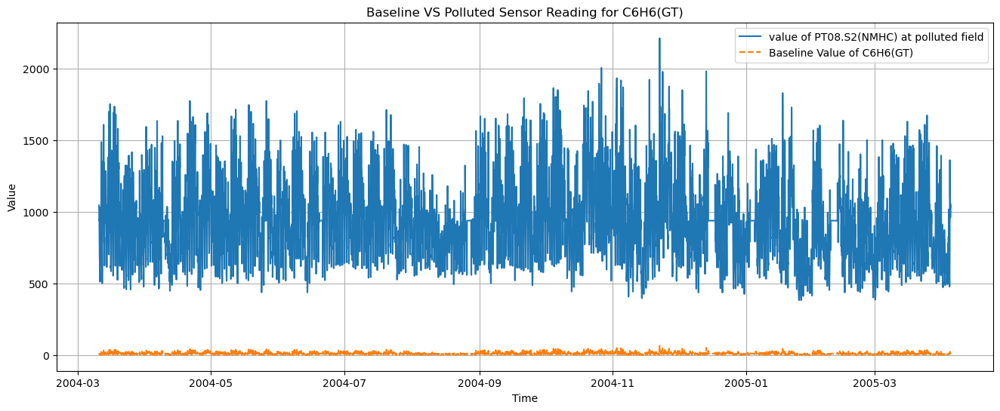

In [83]:
# Baseline VS Polluted Sensor Reading


df_a = df_ni[['datetime', 'CO(GT)', 'PT08.S1(CO)','NOx(GT)', 'PT08.S3(NOx)','NO2(GT)', 'PT08.S4(NO2)','PT08.S2(NMHC)','C6H6(GT)']]

 

def plot_graph(df,a,gt):
    plt.figure(figsize=(16, 6))
    #Actual
    plt.plot(df['datetime'], df[a] , linestyle='-', label=f'value of {a} at polluted field')
    #Baseline
    plt.plot(df['datetime'], df[gt], linestyle='--', label=f'Baseline Value of {gt}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(f'Baseline VS Polluted Sensor Reading for {gt}')
    plt.grid(True)
    plt.legend()  


plot_graph(df = df_a, a= 'PT08.S1(CO)', gt = 'CO(GT)')
plot_graph(df = df_a, a= 'PT08.S3(NOx)', gt = 'NOx(GT)')
plot_graph(df = df_a, a= 'PT08.S4(NO2)', gt = 'NO2(GT)')
plot_graph(df = df_a, a= 'PT08.S2(NMHC)', gt = 'C6H6(GT)')
